In [2]:
#import  the libraries
import torch
import time
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import numpy as np
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, ConcatDataset
import torch.optim.lr_scheduler as lr_scheduler
import sklearn
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold

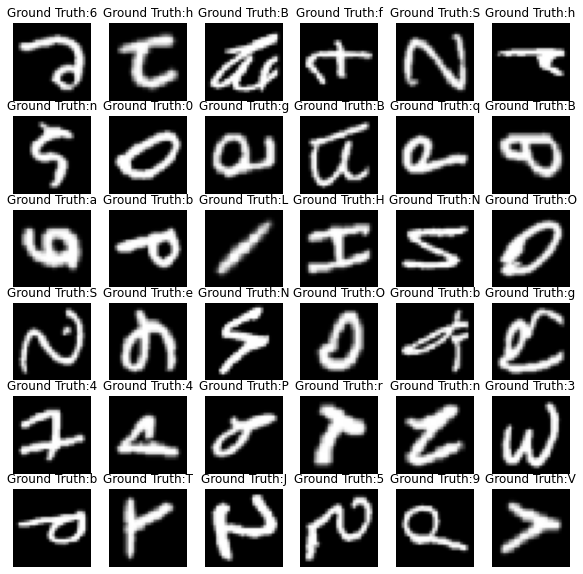

In [4]:
train_set = torchvision.datasets.EMNIST(root = './data/EMNIST', download = True, split = 'balanced',
                                              train = True, transform = transforms.Compose([transforms.ToTensor(),]))

test_set = torchvision.datasets.EMNIST(root = './data/EMNIST', download=True, split = 'balanced',
                                             train=False, transform = transforms.Compose([transforms.ToTensor()]))

dataset = ConcatDataset([train_set, test_set])
# Visulize some figures
figure = plt.figure(figsize=(10, 10))
cols, rows = 6, 6
mapper = {}
path = 'emnist-balanced-mapping.txt'
with open(path) as f:
    for line in f:
       (key, val) = line.split()
       mapper[int(key)] = int(val)
for i in range(1, cols * rows + 1):
    sample_idx = torch.randint(len(train_set), size=(1,)).item()
    img, label = train_set[sample_idx]
    figure.add_subplot(rows, cols, i)
    # plt.title("Label "+ str(label))
    plt.title("Ground Truth:{}".format(chr(mapper[label])))
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")
    
# plt.show()


In [5]:
# DataLoader with the batch_size
print("Training data size: {}".format(len(train_set)))
train_size=len(train_set)
test_size=len(test_set)
print("Training data size: {}".format(len(test_set)))

train_loader = torch.utils.data.DataLoader(train_set,batch_size=20)

test_loader = torch.utils.data.DataLoader(test_set,batch_size=10000)

Training data size: 112800
Training data size: 18800


# MLP

In [6]:
epochs = 15
n_hidden = 3
# Baseline Model
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.ReLU(),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model = MLP()

print(model)

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): ReLU()
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): ReLU()
    (6): Linear(in_features=512, out_features=47, bias=True)
  )
)


## Baseline model

In [7]:
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# define learning rate
learning_rate = 0.005
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=20, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=1000, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
        # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(2.3185, grad_fn=<NllLossBackward0>)
tensor(16.6241)
tensor(1.5777, grad_fn=<NllLossBackward0>)
tensor(55.3520)
tensor(1.4461, grad_fn=<NllLossBackward0>)
tensor(65.9787)
tensor(1.2859, grad_fn=<NllLossBackward0>)
tensor(71.2863)
tensor(1.1172, grad_fn=<NllLossBackward0>)
tensor(74.7988)
tensor(0.9837, grad_fn=<NllLossBackward0>)
tensor(77.1250)
tensor(0.8857, grad_fn=<NllLossBackward0>)
tensor(78.8138)
tensor(0.8078, grad_fn=<NllLossBackward0>)
tensor(80.0807)
tensor(0.7398, grad_fn=<NllLossBackward0>)
tensor(81.1454)
tensor(0.6757, grad_fn=<NllLossBackward0>)
tensor(82.0027)
tensor(

## Loss function and Accuracy Graph



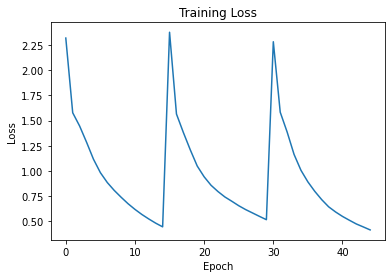

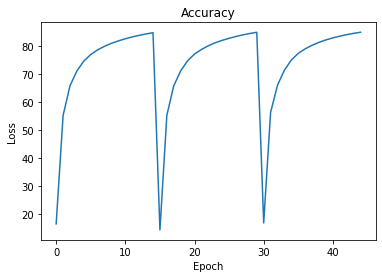

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Adaptive Learning rate

### Step based scheduler

In [7]:
import numpy as np
import matplotlib.pyplot as plt
lrs = []



# loop over the dataset multiple times
losses = []
accuracies = []
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    #  you can set epoch size
    epochs = 15
    # define learning rate
    learning_rate = 0.05
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    # Step based scheduling method
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)
    for i in range(epochs):
      correct = 0
      for j,(images,targets) in enumerate(train_loader):
        
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      scheduler.step()
      lrs.append(optimizer.param_groups[0]["lr"])
      accuracy = 100 * correct / len(train_set)
      # if i>10:
      #   optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

plt.plot([lr for lr in lrs])
plt.show()

print(lrs)

FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(0.9502, grad_fn=<NllLossBackward0>)
tensor(63.0922)
tensor(0.6514, grad_fn=<NllLossBackward0>)
tensor(80.6525)
tensor(0.3563, grad_fn=<NllLossBackward0>)
tensor(86.0177)
tensor(0.3408, grad_fn=<NllLossBackward0>)
tensor(86.6968)
tensor(0.3355, grad_fn=<NllLossBackward0>)
tensor(87.3014)
tensor(0.3356, grad_fn=<NllLossBackward0>)
tensor(87.3980)
tensor(0.3314, grad_fn=<NllLossBackward0>)
tensor(87.4832)
tensor(0.3309, grad_fn=<NllLossBackward0>)
tensor(87.5053)
tensor(0.3306, grad_fn=<NllLossBackward0>)
tensor(87.5195)
tensor(0.3305, grad_fn=<NllLossBackward0>)
tensor(87.5168)
tensor(

NameError: name 'training_start_time' is not defined

### Exponenential scheduler

In [ ]:
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    #  you can set epoch size
    epochs = 15
    # define learning rate
    learning_rate = 0.05
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    # set the epoch
    # Step based scheduling method
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1)
    for i in range(epochs):
      correct = 0
      for j,(images,targets) in enumerate(train_loader):
        
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        lrs.append(optimizer.param_groups[0]["lr"])
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      scheduler.step()
      accuracy = 100 * correct / len(train_set)

      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Complete Training')

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

plt.plot([lr for lr in lrs])
plt.show()

print(lrs)

NameError: name 'KFold' is not defined

## Activation function

### Leaky Relu

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): LeakyReLU(negative_slope=0.1)
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): LeakyReLU(negative_slope=0.1)
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): LeakyReLU(negative_slope=0.1)
    (6): Linear(in_features=512, out_features=512, bias=True)
    (7): LeakyReLU(negative_slope=0.1)
    (8): Linear(in_features=512, out_features=47, bias=True)
  )
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = L

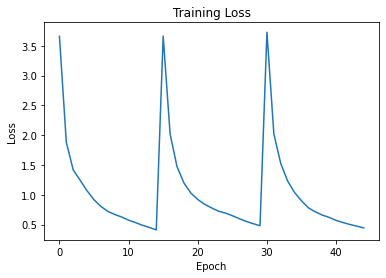

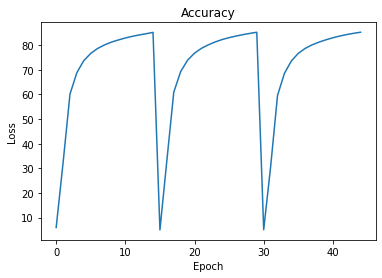

In [11]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 512),
            nn.LeakyReLU(0.1),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model_leaky = MLP()
print(model_leaky)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# define learning rate
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    # set the epoch
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### ELU

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): ELU(alpha=0.1)
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): ELU(alpha=0.1)
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): ELU(alpha=0.1)
    (6): Linear(in_features=512, out_features=512, bias=True)
    (7): ELU(alpha=0.1)
    (8): Linear(in_features=512, out_features=47, bias=True)
  )
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(3.

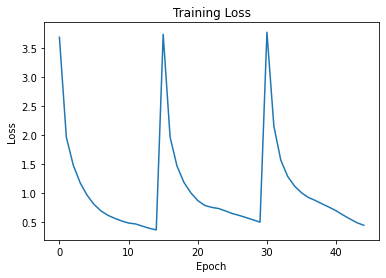

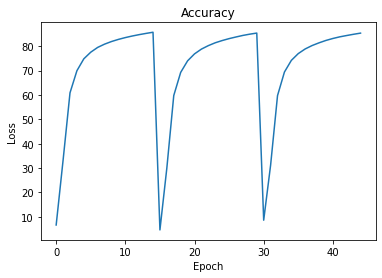

In [12]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512),
            nn.ELU(0.1),
            nn.Linear(512, 512),
            nn.ELU(0.1),
            nn.Linear(512, 512),
            nn.ELU(0.1),
            nn.Linear(512, 512),
            nn.ELU(0.1),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model_elu = MLP()

print(model_elu)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### SELU

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Linear(in_features=784, out_features=512, bias=True)
    (1): SELU(inplace=True)
    (2): Linear(in_features=512, out_features=512, bias=True)
    (3): SELU(inplace=True)
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): SELU(inplace=True)
    (6): Linear(in_features=512, out_features=512, bias=True)
    (7): SELU(inplace=True)
    (8): Linear(in_features=512, out_features=47, bias=True)
  )
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias

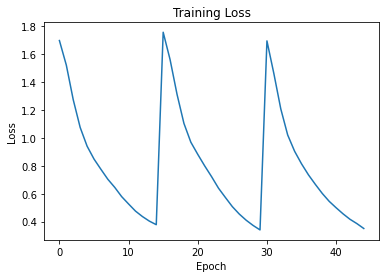

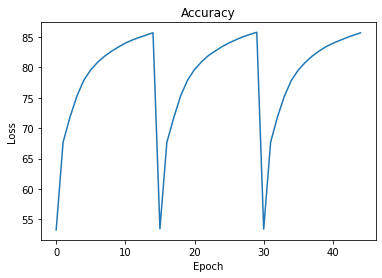

In [13]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512),
            nn.SELU(0.1),
            nn.Linear(512, 512),
            nn.SELU(0.1),
            nn.Linear(512, 512),
            nn.SELU(0.1),
            nn.Linear(512, 512),
            nn.SELU(0.1),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model_selu = MLP()

print(model_selu)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Optimizers

### Adam

FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(5.3846, grad_fn=<NllLossBackward0>)
tensor(3.9025)
tensor(5.2965, grad_fn=<NllLossBackward0>)
tensor(2.1613)
tensor(5.4031, grad_fn=<NllLossBackward0>)
tensor(2.0727)
tensor(5.6282, grad_fn=<NllLossBackward0>)
tensor(2.0789)
tensor(5.4269, grad_fn=<NllLossBackward0>)
tensor(2.0559)
tensor(5.3177, grad_fn=<NllLossBackward0>)
tensor(2.0700)
tensor(5.6488, grad_fn=<NllLossBackward0>)
tensor(2.1401)
tensor(5.2799, grad_fn=<NllLossBackward0>)
tensor(2.0824)
tensor(5.3036, grad_fn=<NllLossBackward0>)

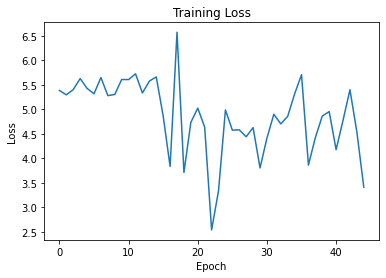

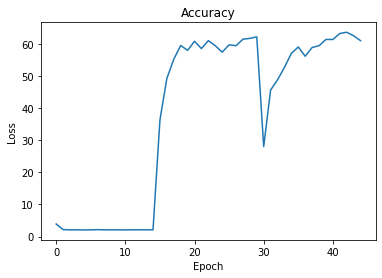

In [14]:
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# define learning rate
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### Adagrad

FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(0.9532, grad_fn=<NllLossBackward0>)
tensor(70.7438)
tensor(0.7461, grad_fn=<NllLossBackward0>)
tensor(80.3067)
tensor(0.6368, grad_fn=<NllLossBackward0>)
tensor(82.6933)
tensor(0.5572, grad_fn=<NllLossBackward0>)
tensor(83.9699)
tensor(0.4963, grad_fn=<NllLossBackward0>)
tensor(84.8582)
tensor(0.4527, grad_fn=<NllLossBackward0>)
tensor(85.5337)
tensor(0.4172, grad_fn=<NllLossBackward0>)
tensor(86.0381)
tensor(0.3886, grad_fn=<NllLossBackward0>)
tensor(86.4885)
tensor(0.3618, grad_fn=<NllLossBac

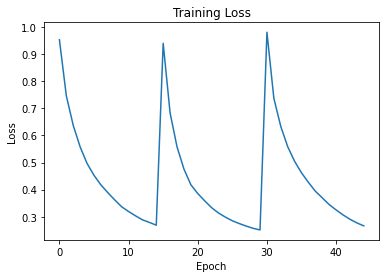

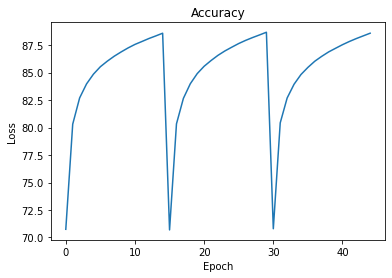

In [16]:
PATH = "/Users/karthiktalluri/Desktop/uk/Sem2/Applied AI/Assg/assg2/models"
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.Adagrad(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
torch.save(model.state_dict(), PATH)
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt
torch.save(model.state_dict(), PATH)
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Batch Normalization

### With Batch Normalization

In [48]:
# Baseline Model
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Linear(28*28, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model_batch = MLP()

print(model_batch)     

#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
        # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Linear(in_features=784, out_features=512, bias=True)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Linear(in_features=512, out_features=512, bias=True)
    (8): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Linear(in_features=512, out_features=512, bias=True)
    (11): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): Linear(in_features=512, out_features=47, bias=True)
  )
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
R

KeyboardInterrupt: 

## L1 and L2 regularization

### L1 Regularization

In [ ]:

#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        l1_lambda = 0.001
        l1_reg = torch.tensor(0., requires_grad=True)
        for name, param in model.named_parameters():
            if 'weight' in name:
                l1_reg = l1_reg + torch.norm(param, 1)
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

print('Complete Training')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### L2 Regularization

FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(0.9787, grad_fn=<NllLos

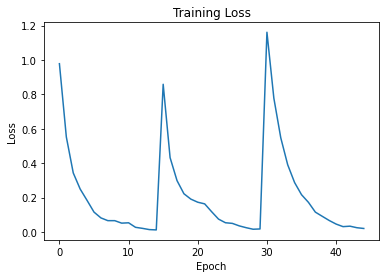

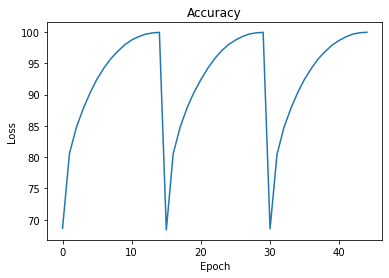

In [18]:

#  you can set epoch sizedef reset_weights(m):
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)

# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        l2_lambda = 0.01
        l2_reg = torch.tensor(0., requires_grad=True)
        for name, param in model.named_parameters():
            if 'weight' in name:
                l2_reg = l2_reg + torch.norm(param, 2)
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')


print('Complete Training')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Dropout

### With Dropout

MLP(
  (flatten): Flatten(start_dim=1, end_dim=-1)
  (linear_relu_stack): Sequential(
    (0): Dropout(p=0.2, inplace=False)
    (1): Linear(in_features=784, out_features=512, bias=True)
    (2): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): ReLU()
    (4): Linear(in_features=512, out_features=512, bias=True)
    (5): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): ReLU()
    (7): Linear(in_features=512, out_features=512, bias=True)
    (8): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): ReLU()
    (10): Linear(in_features=512, out_features=512, bias=True)
    (11): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (12): ReLU()
    (13): Linear(in_features=512, out_features=47, bias=True)
  )
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
R

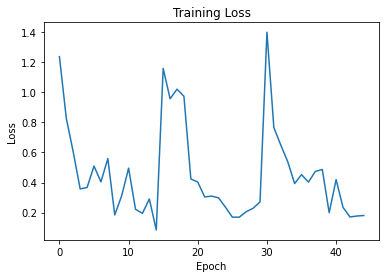

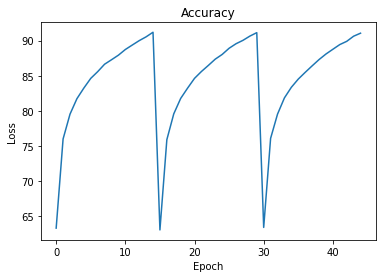

In [28]:
# Baseline Model
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.flatten = nn.Flatten()
        self.linear_relu_stack = nn.Sequential(
            nn.Dropout(0.2),
            nn.Linear(28*28, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 512),
            nn.BatchNorm1d(512),
            nn.ReLU(),
            nn.Linear(512, 47),
        )

    def forward(self, x):
        x = self.flatten(x)
        logits = self.linear_relu_stack(x)
        return logits

# define the model
model_dropout = MLP()

print(model_dropout)     

#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = MLP()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Best model

### Loss function and Accuracy graph

Reset trainable parameters of layer = Linear(in_features=784, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=512, bias=True)
Reset trainable parameters of layer = Linear(in_features=512, out_features=47, bias=True)
tensor(0.8342, grad_fn=<NllLossBackward0>)
tensor(73.3316)
tensor(0.7177, grad_fn=<NllLossBackward0>)
tensor(81.9025)
tensor(0.6292, grad_fn=<NllLossBackward0>)
tensor(83.8413)
tensor(0.5707, grad_fn=<NllLossBackward0>)
tensor(84.9761)
tensor(0.5118, grad_fn=<NllLossBackward0>)
tensor(85.8236)
tensor(0.4633, grad_fn=<NllLossBackward0>)
tensor(86.4539)
tensor(0.4298, grad_fn=<NllLossBackward0>)
tensor(86.9610)
tensor(0.3998, grad_fn=<NllLossBackward0>)
tensor(87.3475)
tensor(0.3774, grad_fn=<NllLossBackward0>)
tensor(87.7252)
tensor(0.3614, grad_fn=<NllLossBackward0>)
tensor(88.0496)
tensor(0.3489, grad_fn=<NllLossBackward0>)
tens

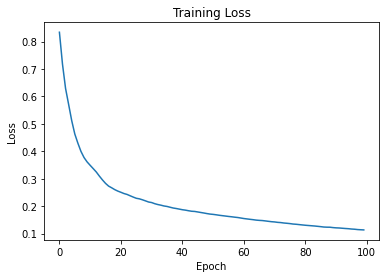

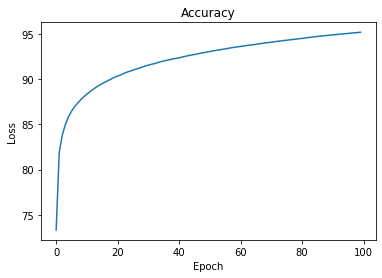

In [32]:
from sklearn.model_selection import train_test_split
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()

# set the epoch
epochs = 100

# loop over the dataset multiple times
losses = []
accuracies = []  
train_set, valid_set = train_test_split(train_set, test_size=0.1, random_state=42)

train_loader = torch.utils.data.DataLoader(train_set,batch_size=20)
valid_loader = torch.utils.data.DataLoader(valid_set,batch_size=20)

# test_loader = torch.utils.data.DataLoader(test_set,batch_size=10000)
model = MLP()
model.apply(reset_weights)
# define learning rate
learning_rate = 0.005
# define your optimizer with SGD and learning rate
optimizer = torch.optim.Adagrad(model.parameters(),lr=learning_rate)
# define the loss function
criterion = nn.CrossEntropyLoss()
training_start_time = time.time()
for i in range(epochs):
  correct = 0
  for j,(images,targets) in enumerate(train_loader):
    #making predictions
    y_pred = model(images)
    #calculating loss
    loss = criterion(y_pred,targets.reshape(-1))
    #backprop
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    correct += (y_pred.argmax(axis = 1) == targets).float().sum()
  accuracy = 100 * correct / len(train_set)
  if i>10:
    optimizer.lr = 0.0005
  print(loss)
  print(accuracy)
  losses.append(loss)
  accuracies.append(accuracy)

print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
print(f'accuracy during training is {accuracy.item()}')
print(f"loss after training is {loss.item()}")

import numpy as np
import matplotlib.pyplot as plt
torch.save(model.state_dict(), PATH)
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()
PATH = "/Users/karthiktalluri/Desktop/uk/Sem2/Applied AI/Assg/assg2/mlp.pt"
torch.save(model, PATH)

### Prediction of top 6 images

4927
Prediction is 43
Accuracy is :  45.44680714607239 %
Prediction: 10071
Prediction: 751
Prediction: 4699
Prediction: 18017
Prediction: 2695
Prediction: 15815


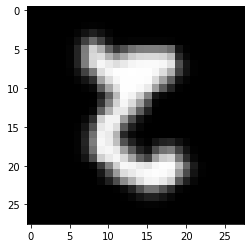

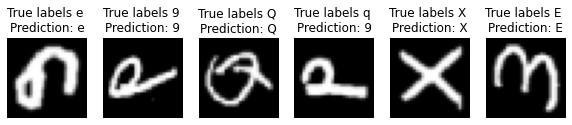

In [30]:
# Test the result on test data

# make a prediction for a sample randomly chose from the test dataset
# you can run this part repeatedly, see the classification result from the model
model_mlp = torch.load("/Users/karthiktalluri/Desktop/uk/Sem2/Applied_AI/Assg/assg2/mlp.pt")
import random
rand_no = random.randint(0,10000)
print(rand_no)

x_test,y_test = next(iter(test_loader))

y_pred = (model_mlp(x_test).argmax(dim=1))

plt.imshow(x_test[rand_no].reshape(28,28),cmap='gray')

pred = model_mlp(x_test[rand_no].reshape(-1,1,28,28)).argmax()

print("Prediction is {}".format(pred))

# compute the accuracy

# compute the accuracy of the model

print("Accuracy is : ",(y_pred.eq(y_test).sum()/test_size).item()*100,"%")

# Visulize some test figures
figure = plt.figure(figsize=(10, 10))
cols= 6
mapper = {}
path = 'emnist-balanced-mapping.txt'
with open(path) as f:
    for line in f:
       (key, val) = line.split()
       mapper[int(key)] = int(val)
for i in range(1, cols + 1):
    sample_idx = torch.randint(len(test_set), size=(1,)).item()
    print("Prediction: {}".format(sample_idx))
    img, label = test_set[i]
    # print(img.shape)
    pred = model_mlp(img.reshape(-1,1,28,28)).argmax()
    figure.add_subplot(rows, cols, i)
    # plt.title("Label "+ str(label))
    plt.title(f"True labels {chr(mapper[label])} \nPrediction: {chr(mapper[pred.item()])}")
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")
plt.show()


### Plot Confusion matrix

- Test Loss:  -0.6104649320561835 

- Accuracy:  85.36170212765957 

- Confusion Matrix: 
 
 Actual      0    1    2    3    4    5    6    7    8    9   ...   37   38  \
Predicted                                                    ...             
0          231    0    0    0    0    0    1    0    0    0  ...    1    1   
1            0  273    0    0    0    0    0    0    0    0  ...    0    1   
2            0    0  334    0    0    0    0    0    0    0  ...    0    3   
3            2    0    0  375    0    1    0    0    0    1  ...    0    0   
4            0    0    0    0  357    0    0    0    0    4  ...    0    1   
5            1    0    0    0    0  338    1    0    1    0  ...    1    0   
6            0    0    0    0    0    1  353    0    0    0  ...   27    0   
7            0    0    0    1    0    0    0  385    1    3  ...    0    0   
8            0    0    0    0    0    0    1    0  349    1  ...    2    1   
9            0    0    0    0    2    0    0    1

Text(0.5, 1.0, 'Confusion Matrix')

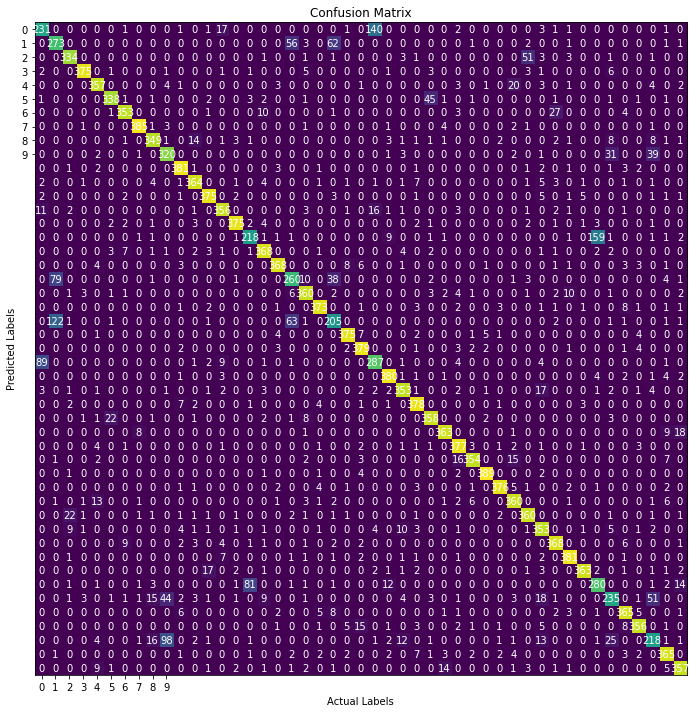

In [24]:
from sklearn.metrics import f1_score, precision_score, recall_score
# we also can plot the Confusion Matrix
import pandas as pd
import torch.nn.functional as F

# accuracy function 
def testing_accuracy(model, data_loader):
    model.eval()
    test_loss = 0
    device = 'cpu'

    y_pred = []
    y_actu = []
    with torch.no_grad():
        for data, target in data_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            # get the index of the max log-probability
            pred = output.argmax(dim=1, keepdim=True)
            y_pred.extend(torch.flatten(pred).tolist()) 
            y_actu.extend(target.tolist())
           
    y_pred = pd.Series(y_pred, name='Actual')
    y_actu = pd.Series(y_actu, name='Predicted')
    cm = pd.crosstab(y_actu, y_pred)
    correct = sum([cm.iloc[i,i] for i in range(len(cm))])
    
    test_loss /= len(data_loader.dataset)
    accuracy = 100*correct/len(test_loader.dataset)
    f1 = f1_score(y_actu, y_pred, average="weighted")
    precision = precision_score(y_actu, y_pred, average= "weighted")
    recall = recall_score(y_actu, y_pred, average= "weighted")

    return (test_loss, accuracy, cm, precision, recall, f1)

test_results = testing_accuracy(model_mlp, test_loader)

print("- Test Loss: ", test_results[0], "\n")
print("- Accuracy: ", test_results[1], "\n")
print("- Confusion Matrix: \n \n",  test_results[2] )
print(f"precision is {test_results[3]}")
print(f"recall is {test_results[4]}")
print(f"f1 score is {test_results[5]}")

import numpy as np
import matplotlib.pyplot as plt

conf_matrix = test_results[2].to_numpy()

fig, ax = plt.subplots(figsize=(20,12))
im = ax.imshow(conf_matrix)

ax.set_xticks(np.arange(10))
ax.set_yticks(np.arange(10))

for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        text = ax.text(j, i, conf_matrix[i, j],
                       ha="center", va="center", color="w")
        
ax.set_xlabel('Actual Labels')
ax.set_ylabel('Predicted Labels')
ax.set_title('Confusion Matrix')

# CNN

In [12]:
epochs = 15
# define the model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.fc2 = nn.Linear(500, 47)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.relu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.relu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.relu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
# create the object for model CNN
net= CNN()
print(net)

CNN(
  (conv1): Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=2000, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=47, bias=True)
)


In [ ]:
# define the parameters
learning_rate = 1e-3
batch_size = 60

#loss = F.nll_loss(output, target)
optimizer = torch.optim.Adam(net.parameters(), lr=learning_rate)
# optimizer = torch.optim.SGD(net.parameters(), lr=learning_rate) # Stochastic Gradient Descent

print(len(train_loader.dataset))
print(len(test_loader.dataset))

112800
18800


In [ ]:
#  train the model
correct = 0
loss_list = []
accuracy_list = []
for i in range(1,epochs+1):
   print(f"Epoch {i}\n-------------------------------")
   net.train()
   for batch_idx, (data, target) in enumerate(train_loader):
      
      optimizer.zero_grad()
      output = net(data)
      
      loss = F.nll_loss(output, target) # negative log likelihood loss used for classification
      loss.backward()
      optimizer.step()
   loss_list.append(loss.data)
   print('iteration: {}, \t loss: {}'.format(i, loss.item()))

Epoch 1
-------------------------------


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_60023/519184945.py:35: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


iteration: 1, 	 loss: 0.6582522392272949
Epoch 2
-------------------------------
iteration: 2, 	 loss: 0.5482719540596008
Epoch 3
-------------------------------
iteration: 3, 	 loss: 0.43767252564430237
Epoch 4
-------------------------------
iteration: 4, 	 loss: 0.24257946014404297
Epoch 5
-------------------------------
iteration: 5, 	 loss: 0.1896636188030243
Epoch 6
-------------------------------
iteration: 6, 	 loss: 0.383840411901474
Epoch 7
-------------------------------
iteration: 7, 	 loss: 0.12634848058223724
Epoch 8
-------------------------------
iteration: 8, 	 loss: 0.17646627128124237
Epoch 9
-------------------------------
iteration: 9, 	 loss: 0.04509693384170532
Epoch 10
-------------------------------
iteration: 10, 	 loss: 0.02450164221227169
Epoch 11
-------------------------------
iteration: 11, 	 loss: 0.012183980084955692
Epoch 12
-------------------------------
iteration: 12, 	 loss: 0.024032602086663246
Epoch 13
-------------------------------
iteration: 1

## Baseline

In [54]:
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
# define learning rate
learning_rate = 0.01
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=20, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=1000, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
        # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
        correct = 0
        training_start_time = time.time()
        for j,(images,targets) in enumerate(trainloader):
            #making predictions
            y_pred = model(images)
            #calculating loss
            loss = criterion(y_pred,targets.reshape(-1))
            #backprop
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            correct += (y_pred.argmax(axis = 1) == targets).float().sum()
        accuracy = 100 * correct / len(train_set)
        # if i>10:
        #   optimizer.lr = 0.0005
        losses.append(loss)
        accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/20544731.py:36: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


Training finished, took 20.38s
accuracy during training is 60.90248107910156
loss after training is 0.05154220387339592
Accuracy for fold 0: 84 %
--------------------------------
FOLD 1
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)
Training finished, took 19.77s
accuracy during training is 61.21187973022461
loss after training is 0.31672582030296326
Accuracy for fold 1: 85 %
--------------------------------
FOLD 2
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of 

## Loss function and Accuracy Graph



## Adaptive Learning rate

### Step based scheduler

[0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005

/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/519184945.py:35: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(0.6342, grad_fn=<NllLossBackward0>)
tensor(74.8103)
tensor(0.4920, grad_fn=<NllLossBackward0>)
tensor(85.3759)
tensor(0.2173, grad_fn=<NllLossBackward0>)
tensor(89.4725)
tensor(0.2208, grad_fn=<NllLossBackward0>)
tensor(90.1445)
tensor(0.2030, grad_fn=<NllLossBackward0>)
tensor(90.7961)
tensor(0.2061, grad_fn=<NllLossBackward0>)
tensor(90.8732)
tensor(0.2021, grad_fn=<NllLossBackward0>)
tensor(90.9902)
tensor(0.2018, grad_fn=<NllLossBackward0>)
tensor(90.9991)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0106)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0115)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0124)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0124)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0124)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0115)
tensor(0.2015, grad_fn=<NllLossBackward0>)
tensor(91.0115)
Complete Training
Training finished, took 21955.78s
accuracy during training is 91.01152801513672
loss after traini

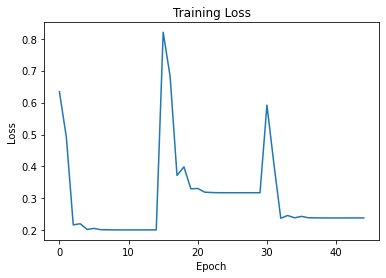

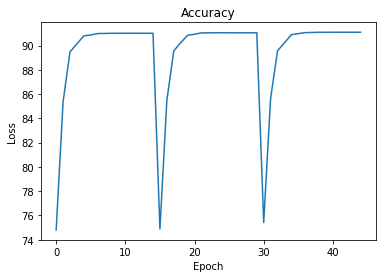

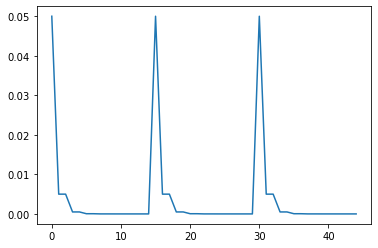

[0.05, 0.005000000000000001, 0.005000000000000001, 0.0005000000000000001, 0.0005000000000000001, 5.0000000000000016e-05, 5.0000000000000016e-05, 5.000000000000002e-06, 5.000000000000002e-06, 5.000000000000002e-07, 5.000000000000002e-07, 5.0000000000000024e-08, 5.0000000000000024e-08, 5.0000000000000026e-09, 5.0000000000000026e-09, 0.05, 0.005000000000000001, 0.005000000000000001, 0.0005000000000000001, 0.0005000000000000001, 5.0000000000000016e-05, 5.0000000000000016e-05, 5.000000000000002e-06, 5.000000000000002e-06, 5.000000000000002e-07, 5.000000000000002e-07, 5.0000000000000024e-08, 5.0000000000000024e-08, 5.0000000000000026e-09, 5.0000000000000026e-09, 0.05, 0.005000000000000001, 0.005000000000000001, 0.0005000000000000001, 0.0005000000000000001, 5.0000000000000016e-05, 5.0000000000000016e-05, 5.000000000000002e-06, 5.000000000000002e-06, 5.000000000000002e-07, 5.000000000000002e-07, 5.0000000000000024e-08, 5.0000000000000024e-08, 5.0000000000000026e-09, 5.0000000000000026e-09]


In [24]:
print(lrs)
import numpy as np
import matplotlib.pyplot as plt
#  you can set epoch size
epochs = 15
lrs = []



# loop over the dataset multiple times
losses = []
accuracies = []
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=20, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=1000, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.05
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    # Step based scheduling method
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=2, gamma=0.1)
    for i in range(epochs):
      correct = 0
      for j,(images,targets) in enumerate(train_loader):
        
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      scheduler.step()
      lrs.append(optimizer.param_groups[0]["lr"])
      accuracy = 100 * correct / len(train_set)
      # if i>10:
      #   optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Complete Training')

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
    print(f"loss after training is {loss.item()}")
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

plt.plot([lr for lr in lrs])
plt.show()

print(lrs)

### Exponenential scheduler

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/519184945.py:35: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.0541, grad_fn=<NllLossBackward0>)
tensor(53.9654)
tensor(0.7768, grad_fn=<NllLossBackward0>)
tensor(78.7473)
tensor(0.7397, grad_fn=<NllLossBackward0>)
tensor(80.0204)
tensor(0.7340, grad_fn=<NllLossBackward0>)
tensor(80.1676)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1826)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1809)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
tensor(0.7335, grad_fn=<NllLossBackward0>)
tensor(80.1817)
Complete Training
Training finished, took 23343.27s
Accuracy for fold 0: 80 %
--------------------------------
FOLD

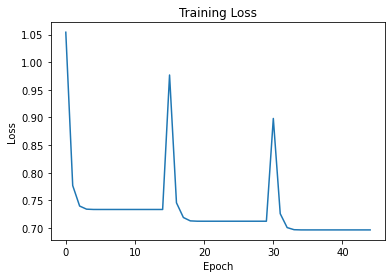

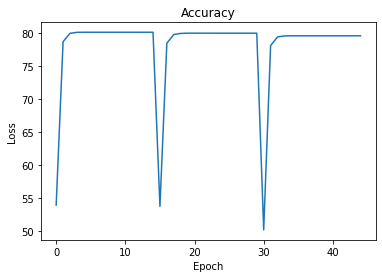

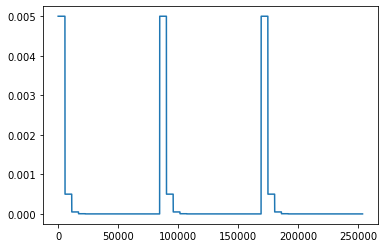

[0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005, 0.005

In [25]:
# define learning rate
learning_rate = 0.005
lrs = []

import numpy as np
import matplotlib.pyplot as plt
#  you can set epoch size
# loop over the dataset multiple times
losses = []
accuracies = []
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
epochs = 15
kfold = KFold(n_splits=k_folds, shuffle=True)
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    # set the epoch
    # Step based scheduling method
    scheduler = torch.optim.lr_scheduler.ExponentialLR(optimizer, gamma=0.1)
    for i in range(epochs):
      correct = 0
      for j,(images,targets) in enumerate(train_loader):
        
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        lrs.append(optimizer.param_groups[0]["lr"])
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      scheduler.step()
      accuracy = 100 * correct / len(train_set)
      # if i>10:
      #   optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Complete Training')

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

plt.plot([lr for lr in lrs])
plt.show()

print(lrs)

## Activation function

### Leaky Relu

CNN(
  (conv1): Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=2000, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=47, bias=True)
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2452303447.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(0.9345, grad_fn=<NllLossBackward0>)
tensor(57.9477)
tensor(0.7218, grad_fn=<NllLossBackward0>)
tensor(77.5727)
tensor(0.6555, grad_fn=<NllLossBackward0>)
tensor(81.2615)
tensor(0.5988, grad_fn=<NllLossBackward0>)
tensor(83.0904)
tensor(0.5516, grad_fn=<NllLossBackward0>)
tensor(84.3431)
tensor(0.5100, grad_fn=<NllLossBackward0>)
tensor(85.3635)
tensor(0.4314, grad_fn=<NllLossBackward0>)
tensor(86.1232)
tensor(0.3661, grad_fn=<NllLossBackward0>)
tensor(86.8103)
tensor(0.3319, grad_fn=<NllLossBackward0>)
tensor(87.3599)
tensor(0.3100, grad_fn=<NllLossBackward0>)
tensor(87.9176)
tensor(0.2886, grad_fn=<NllLossBackward0>)
tensor(88.3670)
tensor(0.2632, grad_fn=<NllLossBackward0>)
tensor(88.8457)
tensor(0.2450, grad_fn=<NllLossBackward0>)
tensor(89.1525)
tensor(0.2507, grad_fn=<NllLossBackward0>)
tensor(89.5638)
tensor(0.2317, grad_fn=<NllLossBackward0>)
tensor(89.9716)
Training finished, took 28.76s
Accuracy for fold 0: 89 %
--------------------------------
FOLD 1
------------------

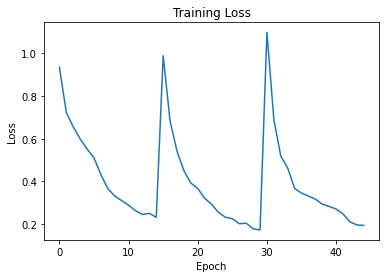

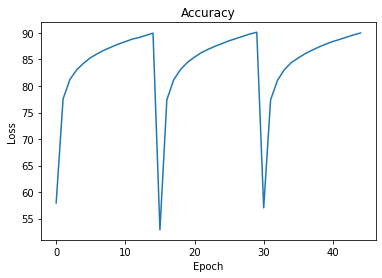

In [8]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.fc2 = nn.Linear(500, 47)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.leaky_relu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.leaky_relu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.leaky_relu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
# define the model
model_leaky = CNN()
print(model_leaky)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### ELU

CNN(
  (conv1): Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=2000, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=47, bias=True)
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/3103648735.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(0.9709, grad_fn=<NllLossBackward0>)
tensor(59.4725)
tensor(0.5953, grad_fn=<NllLossBackward0>)
tensor(78.7580)
tensor(0.4568, grad_fn=<NllLossBackward0>)
tensor(82.3785)
tensor(0.3900, grad_fn=<NllLossBackward0>)
tensor(84.1489)
tensor(0.3382, grad_fn=<NllLossBackward0>)
tensor(85.4140)
tensor(0.2927, grad_fn=<NllLossBackward0>)
tensor(86.3732)
tensor(0.2586, grad_fn=<NllLossBackward0>)
tensor(87.1392)
tensor(0.2371, grad_fn=<NllLossBackward0>)
tensor(87.7216)
tensor(0.2154, grad_fn=<NllLossBackward0>)
tensor(88.2890)
tensor(0.1959, grad_fn=<NllLossBackward0>)
tensor(88.7970)
tensor(0.1795, grad_fn=<NllLossBackward0>)
tensor(89.2686)
tensor(0.1664, grad_fn=<NllLossBackward0>)
tensor(89.7021)
tensor(0.1557, grad_fn=<NllLossBackward0>)
tensor(90.1073)
tensor(0.1450, grad_fn=<NllLossBackward0>)
tensor(90.5186)
tensor(0.1352, grad_fn=<NllLossBackward0>)
tensor(90.9238)
Training finished, took 332.56s
Accuracy for fold 0: 90 %
--------------------------------
FOLD 1
-----------------

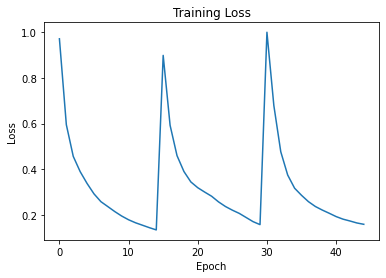

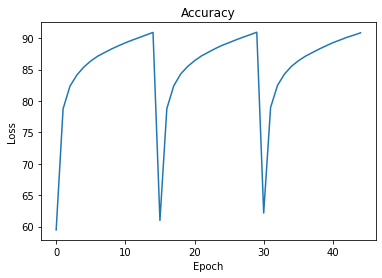

In [9]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.fc2 = nn.Linear(500, 47)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.elu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.elu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.elu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
# define the model
model_elu = CNN()

print(model_elu)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### SELU

CNN(
  (conv1): Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
  (conv2): Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
  (fc1): Linear(in_features=2000, out_features=500, bias=True)
  (fc2): Linear(in_features=500, out_features=47, bias=True)
)
FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2200768786.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.0466, grad_fn=<NllLossBackward0>)
tensor(65.1179)
tensor(0.6687, grad_fn=<NllLossBackward0>)
tensor(79.1764)
tensor(0.5313, grad_fn=<NllLossBackward0>)
tensor(82.6436)
tensor(0.4278, grad_fn=<NllLossBackward0>)
tensor(84.4548)
tensor(0.3739, grad_fn=<NllLossBackward0>)
tensor(85.6223)
tensor(0.3361, grad_fn=<NllLossBackward0>)
tensor(86.5053)
tensor(0.3025, grad_fn=<NllLossBackward0>)
tensor(87.2074)
tensor(0.2754, grad_fn=<NllLossBackward0>)
tensor(87.8103)
tensor(0.2434, grad_fn=<NllLossBackward0>)
tensor(88.3688)
tensor(0.2190, grad_fn=<NllLossBackward0>)
tensor(88.8715)
tensor(0.2027, grad_fn=<NllLossBackward0>)
tensor(89.3546)
tensor(0.1773, grad_fn=<NllLossBackward0>)
tensor(89.7589)
tensor(0.1624, grad_fn=<NllLossBackward0>)
tensor(90.1587)
tensor(0.1485, grad_fn=<NllLossBackward0>)
tensor(90.6028)
tensor(0.1406, grad_fn=<NllLossBackward0>)
tensor(90.9743)
Training finished, took 34.19s
Accuracy for fold 0: 90 %
--------------------------------
FOLD 1
------------------

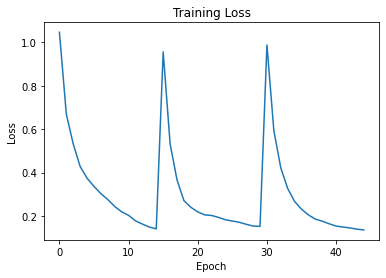

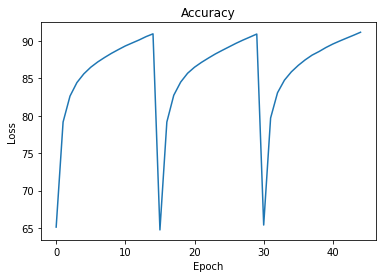

In [10]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.fc2 = nn.Linear(500, 47)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.selu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.selu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.selu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
# define the model
model_selu = CNN()

print(model_selu)
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Optimizers

### Adam

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2200768786.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(5.4972, grad_fn=<NllLossBackward0>)
tensor(61.7429)
tensor(3.8802, grad_fn=<NllLossBackward0>)
tensor(70.5372)
tensor(5.1877, grad_fn=<NllLossBackward0>)
tensor(72.8635)
tensor(2.8941, grad_fn=<NllLossBackward0>)
tensor(73.7633)
tensor(1.5847, grad_fn=<NllLossBackward0>)
tensor(74.3901)
tensor(3.0457, grad_fn=<NllLossBackward0>)
tensor(74.8298)
tensor(2.5756, grad_fn=<NllLossBackward0>)
tensor(75.2012)
tensor(3.6032, grad_fn=<NllLossBackward0>)
tensor(75.3493)
tensor(2.0390, grad_fn=<NllLossBackward0>)
tensor(75.8457)
tensor(7.0375, grad_fn=<NllLossBackward0>)
tensor(76.0390)
tensor(5.7228, grad_fn=<NllLossBackward0>)
tensor(76.1543)
tensor(3.1024, grad_fn=<NllLossBackward0>)
tensor(76.1631)
tensor(3.0511, grad_fn=<NllLossBackward0>)
tensor(76.7181)
tensor(5.2262, grad_fn=<NllLossBackward0>)
tensor(76.4929)
tensor(6.2534, grad_fn=<NllLossBackward0>)
tensor(76.2739)
Training finished, took 43.62s
accuracy during training is 76.27393341064453
Accuracy for fold 0: 74 %
------------

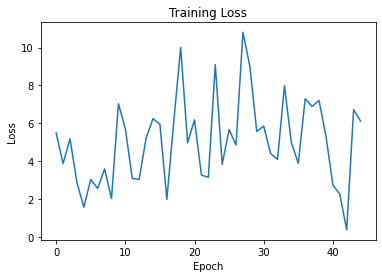

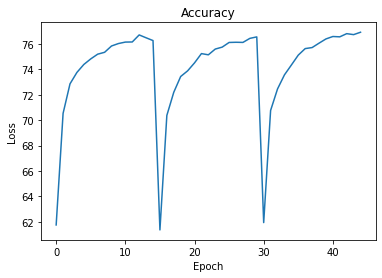

In [11]:
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
model = CNN()
# define the loss function
criterion = nn.CrossEntropyLoss()


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    k_folds = 3
    epochs = 15
    kfold = KFold(n_splits=k_folds, shuffle=True)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.Adam(model.parameters(),lr=learning_rate)
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### Adagrad

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2200768786.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(0.6111, grad_fn=<NllLossBackward0>)
tensor(76.2988)
tensor(0.4008, grad_fn=<NllLossBackward0>)
tensor(83.4433)
tensor(0.3270, grad_fn=<NllLossBackward0>)
tensor(85.1161)
tensor(0.2940, grad_fn=<NllLossBackward0>)
tensor(86.1126)
tensor(0.2743, grad_fn=<NllLossBackward0>)
tensor(86.7784)
tensor(0.2614, grad_fn=<NllLossBackward0>)
tensor(87.3200)
tensor(0.2515, grad_fn=<NllLossBackward0>)
tensor(87.7199)
tensor(0.2447, grad_fn=<NllLossBackward0>)
tensor(88.0931)
tensor(0.2386, grad_fn=<NllLossBackward0>)
tensor(88.3608)
tensor(0.2329, grad_fn=<NllLossBackward0>)
tensor(88.6170)
tensor(0.2291, grad_fn=<NllLossBackward0>)
tensor(88.8085)
tensor(0.2259, grad_fn=<NllLossBackward0>)
tensor(89.0151)
tensor(0.2218, grad_fn=<NllLossBackward0>)
tensor(89.2234)
tensor(0.2179, grad_fn=<NllLossBackward0>)
tensor(89.4122)
tensor(0.2151, grad_fn=<NllLossBackward0>)
tensor(89.5984)
Training finished, took 54.21s
accuracy during training is 89.59840393066406
Accuracy for fold 0: 89 %
------------

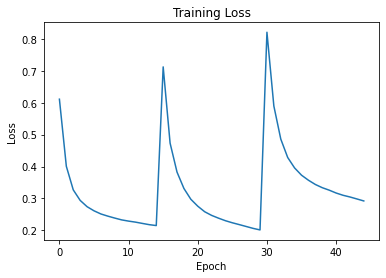

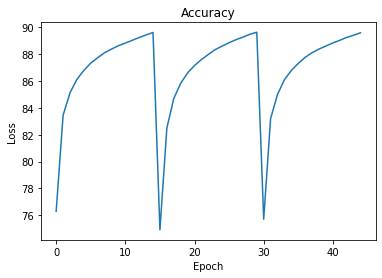

In [12]:
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
model = CNN()
k_folds = 3
epochs = 15
kfold = KFold(n_splits=k_folds, shuffle=True)


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.Adagrad(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Batch Normalization

### With Batch Normalization

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = BatchNorm1d(500, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_60023/704272180.py:36: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.0746, grad_fn=<NllLossBackward0>)
tensor(52.3129)
tensor(0.7571, grad_fn=<NllLossBackward0>)
tensor(77.1631)
tensor(0.6281, grad_fn=<NllLossBackward0>)
tensor(81.2438)
tensor(0.5623, grad_fn=<NllLossBackward0>)
tensor(83.3147)
tensor(0.5300, grad_fn=<NllLossBackward0>)
tensor(84.6862)
tensor(0.4423, grad_fn=<NllLossBackward0>)
tensor(85.7340)
tensor(0.4046, grad_fn=<NllLossBackward0>)
tensor(86.5922)
tensor(0.3879, grad_fn=<NllLossBackward0>)
tensor(87.1862)
tensor(0.3477, grad_fn=<NllLossBackward0>)
tensor(87.8537)
tensor(0.3253, grad_fn=<NllLossBackward0>)
tensor(88.3324)
tensor(0.3077, grad_fn=<NllLossBackward0>)
tensor(88.8369)
tensor(0.2821, grad_fn=<NllLossBackward0>)
tensor(89.2491)
tensor(0.2766, grad_fn=<NllLossBackward0>)
tensor(89.7287)
tensor(0.2667, grad_fn=<NllLossBackward0>)
tensor(90.1241)
tensor(0.2601, grad_fn=<NllLossBackward0>)
tensor(90.4991)
Training finished, took 29.10s
accuracy during training is 90.49911499023438
Accuracy for fold 0: 90 %
------------

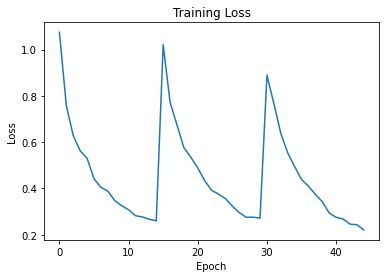

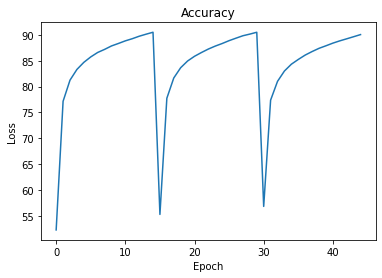

In [39]:
# Baseline Model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.bn1 = nn.BatchNorm2d(10) 
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.bn3 = nn.BatchNorm1d(500)
        self.fc2 = nn.Linear(500, 47)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.relu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.relu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.relu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### Without Batch Normalization

## L1 and L2 regularization#

### L1 Regularization

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2200768786.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.1577, grad_fn=<NllLossBackward0>)
tensor(64.8280)
tensor(0.6634, grad_fn=<NllLossBackward0>)
tensor(80.0275)
tensor(0.4478, grad_fn=<NllLossBackward0>)
tensor(83.8014)
tensor(0.3677, grad_fn=<NllLossBackward0>)
tensor(85.3644)
tensor(0.3322, grad_fn=<NllLossBackward0>)
tensor(86.4415)
tensor(0.3142, grad_fn=<NllLossBackward0>)
tensor(87.1826)
tensor(0.3035, grad_fn=<NllLossBackward0>)
tensor(87.8156)
tensor(0.2831, grad_fn=<NllLossBackward0>)
tensor(88.3475)
tensor(0.2611, grad_fn=<NllLossBackward0>)
tensor(88.8635)
tensor(0.2433, grad_fn=<NllLossBackward0>)
tensor(89.3298)
tensor(0.2275, grad_fn=<NllLossBackward0>)
tensor(89.7296)
tensor(0.2172, grad_fn=<NllLossBackward0>)
tensor(90.1285)
tensor(0.2092, grad_fn=<NllLossBackward0>)
tensor(90.5098)
tensor(0.1959, grad_fn=<NllLossBackward0>)
tensor(90.8768)
tensor(0.1917, grad_fn=<NllLossBackward0>)
tensor(91.2243)
Training finished, took 37.44s
Accuracy for fold 0: 91 %
--------------------------------
FOLD 1
------------------

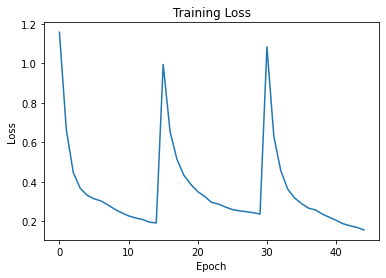

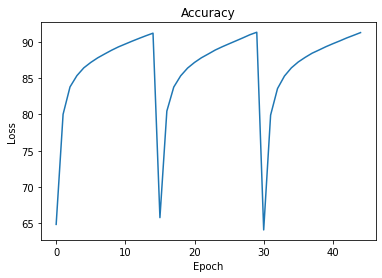

In [13]:

#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
model = CNN()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        l1_lambda = 0.001
        l1_reg = torch.tensor(0., requires_grad=True)
        for name, param in model.named_parameters():
            if 'weight' in name:
                l1_reg = l1_reg + torch.norm(param, 1)
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')

print('Complete Training')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

### L2 Regularization

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/2200768786.py:33: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.0404, grad_fn=<NllLossBackward0>)
tensor(66.0833)
tensor(0.5990, grad_fn=<NllLossBackward0>)
tensor(79.9184)
tensor(0.4064, grad_fn=<NllLossBackward0>)
tensor(83.2766)
tensor(0.3280, grad_fn=<NllLossBackward0>)
tensor(84.8484)
tensor(0.2857, grad_fn=<NllLossBackward0>)
tensor(85.9211)
tensor(0.2660, grad_fn=<NllLossBackward0>)
tensor(86.6897)
tensor(0.2445, grad_fn=<NllLossBackward0>)
tensor(87.3546)
tensor(0.2341, grad_fn=<NllLossBackward0>)
tensor(87.9397)
tensor(0.2302, grad_fn=<NllLossBackward0>)
tensor(88.4583)
tensor(0.2319, grad_fn=<NllLossBackward0>)
tensor(88.9441)
tensor(0.2318, grad_fn=<NllLossBackward0>)
tensor(89.4060)
tensor(0.2341, grad_fn=<NllLossBackward0>)
tensor(89.8209)
tensor(0.2304, grad_fn=<NllLossBackward0>)
tensor(90.2172)
tensor(0.2283, grad_fn=<NllLossBackward0>)
tensor(90.6232)
tensor(0.2334, grad_fn=<NllLossBackward0>)
tensor(91.0363)
Training finished, took 34.02s
Accuracy for fold 0: 90 %
--------------------------------
FOLD 1
------------------

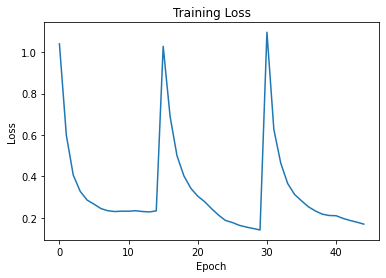

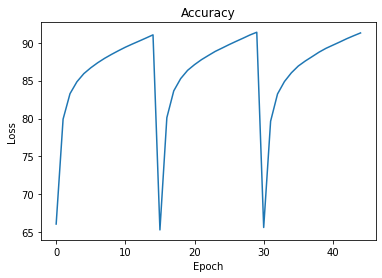

In [15]:

def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
model = CNN()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        l2_lambda = 0.01
        l2_reg = torch.tensor(0., requires_grad=True)
        for name, param in model.named_parameters():
            if 'weight' in name:
                l2_reg = l2_reg + torch.norm(param, 2)
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')


print('Complete Training')
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Dropout

### With Dropout

FOLD 0
--------------------------------
Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_71825/20544731.py:36: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(1.0061, grad_fn=<NllLossBackward0>)
tensor(58.1551)
tensor(0.7557, grad_fn=<NllLossBackward0>)
tensor(77.4025)
tensor(0.6287, grad_fn=<NllLossBackward0>)
tensor(81.1011)
tensor(0.5371, grad_fn=<NllLossBackward0>)
tensor(83.0018)
tensor(0.4922, grad_fn=<NllLossBackward0>)
tensor(84.2606)
tensor(0.4639, grad_fn=<NllLossBackward0>)
tensor(85.3041)
tensor(0.4111, grad_fn=<NllLossBackward0>)
tensor(86.1277)
tensor(0.4197, grad_fn=<NllLossBackward0>)
tensor(86.7890)
tensor(0.4156, grad_fn=<NllLossBackward0>)
tensor(87.3635)
tensor(0.3746, grad_fn=<NllLossBackward0>)
tensor(87.9459)
tensor(0.3451, grad_fn=<NllLossBackward0>)
tensor(88.4504)
tensor(0.2978, grad_fn=<NllLossBackward0>)
tensor(88.8883)
tensor(0.3210, grad_fn=<NllLossBackward0>)
tensor(89.3475)
tensor(0.3005, grad_fn=<NllLossBackward0>)
tensor(89.7234)
tensor(0.2884, grad_fn=<NllLossBackward0>)
tensor(90.1667)
Training finished, took 29.90s
accuracy during training is 90.16666412353516
Accuracy for fold 0: 89 %
------------

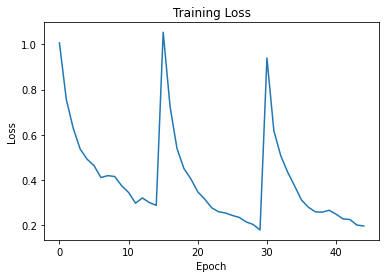

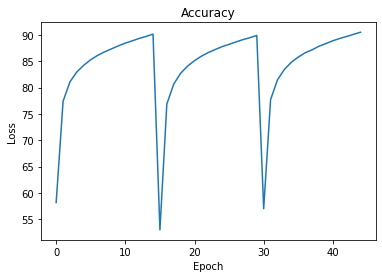

In [26]:
# define the model
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.fc2 = nn.Linear(500, 47)

        self.dropout = nn.Dropout(p=0.5)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.relu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.relu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.relu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)
    
#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()
model = CNN()
k_folds = 3
kfold = KFold(n_splits=k_folds, shuffle=True)
# set the epoch
epochs = 15


# loop over the dataset multiple times
losses = []
accuracies = []
results = {}
for fold, (train_ids, test_ids) in enumerate(kfold.split(train_set)):
    
    # Print
    print(f'FOLD {fold}')
    print('--------------------------------')
    
    # Sample elements randomly from a given list of ids, no replacement.
    train_subsampler = torch.utils.data.SubsetRandomSampler(train_ids)
    test_subsampler = torch.utils.data.SubsetRandomSampler(test_ids)
    
    # Define data loaders for training and testing data in this fold
    trainloader = torch.utils.data.DataLoader(
                      train_set, 
                      batch_size=10, sampler=train_subsampler)
    testloader = torch.utils.data.DataLoader(
                      train_set,
                      batch_size=10, sampler=test_subsampler)
    model = CNN()
    model.apply(reset_weights)
    # define learning rate
    learning_rate = 0.005
    # define your optimizer with SGD and learning rate
    optimizer = torch.optim.SGD(model.parameters(),lr=learning_rate)
    # define the loss function
    criterion = nn.CrossEntropyLoss()
    for i in range(epochs):
      correct = 0
      training_start_time = time.time()
      for j,(images,targets) in enumerate(train_loader):
        #making predictions
        y_pred = model(images)
        #calculating loss
        loss = criterion(y_pred,targets.reshape(-1))
        #backprop
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        correct += (y_pred.argmax(axis = 1) == targets).float().sum()
      accuracy = 100 * correct / len(train_set)
      if i>10:
        optimizer.lr = 0.0005
      print(loss)
      print(accuracy)
      losses.append(loss)
      accuracies.append(accuracy)

    print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
    print(f'accuracy during training is {accuracy.item()}')
     # Evaluationfor this fold
    correct, total = 0, 0
    with torch.no_grad():

      # Iterate over the test data and generate predictions
      for i, data in enumerate(testloader, 0):

        # Get inputs
        inputs, targets = data

        # Generate outputs
        outputs = model(inputs)

        # Set total and correct
        _, predicted = torch.max(outputs.data, 1)
        total += targets.size(0)
        correct += (predicted == targets).sum().item()

      # Print accuracy
      print('Accuracy for fold %d: %d %%' % (fold, 100.0 * correct / total))
      print('--------------------------------')
      results[fold] = 100.0 * (correct / total)
    
# Print fold results
print(f'K-FOLD CROSS VALIDATION RESULTS FOR {k_folds} FOLDS')
print('--------------------------------')
sum = 0.0
for key, value in results.items():
  print(f'Fold {key}: {value} %')
  sum += value
print(f'Average: {sum/len(results.items())} %')
import numpy as np
import matplotlib.pyplot as plt

# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()

## Best Model

### Loss function and Accuracy graph

Reset trainable parameters of layer = Conv2d(1, 10, kernel_size=(5, 5), stride=(1, 1))
Reset trainable parameters of layer = BatchNorm2d(10, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Conv2d(10, 20, kernel_size=(3, 3), stride=(1, 1))
Reset trainable parameters of layer = Linear(in_features=2000, out_features=500, bias=True)
Reset trainable parameters of layer = BatchNorm1d(500, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
Reset trainable parameters of layer = Linear(in_features=500, out_features=47, bias=True)


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_42124/1912209600.py:40: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


tensor(0.7818, grad_fn=<NllLossBackward0>)
tensor(78.0355)
tensor(0.6435, grad_fn=<NllLossBackward0>)
tensor(84.5452)
tensor(0.5503, grad_fn=<NllLossBackward0>)
tensor(85.9707)
tensor(0.4843, grad_fn=<NllLossBackward0>)
tensor(86.8369)
tensor(0.4415, grad_fn=<NllLossBackward0>)
tensor(87.3927)
tensor(0.4044, grad_fn=<NllLossBackward0>)
tensor(87.8431)
tensor(0.3827, grad_fn=<NllLossBackward0>)
tensor(88.2172)
tensor(0.3620, grad_fn=<NllLossBackward0>)
tensor(88.4973)
tensor(0.3455, grad_fn=<NllLossBackward0>)
tensor(88.8059)
tensor(0.3323, grad_fn=<NllLossBackward0>)
tensor(89.0505)
tensor(0.3166, grad_fn=<NllLossBackward0>)
tensor(89.2828)
tensor(0.3035, grad_fn=<NllLossBackward0>)
tensor(89.5160)
tensor(0.2926, grad_fn=<NllLossBackward0>)
tensor(89.7216)
tensor(0.2825, grad_fn=<NllLossBackward0>)
tensor(89.9087)
tensor(0.2729, grad_fn=<NllLossBackward0>)
tensor(90.0567)
tensor(0.2668, grad_fn=<NllLossBackward0>)
tensor(90.2004)
tensor(0.2617, grad_fn=<NllLossBackward0>)
tensor(90.323

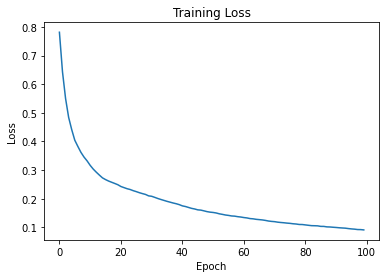

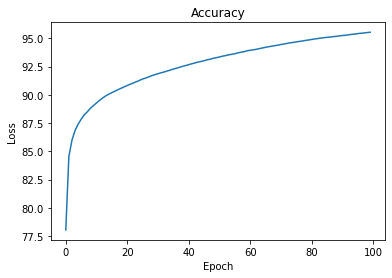

In [33]:
import numpy as np
import matplotlib.pyplot as plt

class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__()

        self.conv1 = nn.Conv2d(1,10,5)    # Convolutional layer
        self.bn1 = nn.BatchNorm2d(10) 
        self.conv2 = nn.Conv2d(10,20,3)

        self.fc1 = nn.Linear(20*10*10,500)
        self.bn3 = nn.BatchNorm1d(500)
        self.fc2 = nn.Linear(500, 47)

        # self.dropout = nn.Dropout(p=0.2)

    def forward(self, x):     
        input_size = x.size(0)
        # in: batch*1*28*28, out: batch*10*24*24(28-5+1)
        x = self.conv1(x)
        # out: batch*10*24*24
        x = F.relu(x)
        # in: batch*10*24*24, out: batch*10*12*12
        x = F.max_pool2d(x,2,2)

        # in: batch*10*12*12, out: batch*20*10*10 (12-3+1)
        x = self.conv2(x)
        x = F.relu(x)

        # 20*10*10 = 2000
        x = x.view(input_size,-1)

        # in: batch*2000  out:batch*500
        x = self.fc1(x)
        x = F.relu(x)

        # in:batch*500 out:batch*10
        x = self.fc2(x)
        return F.log_softmax(x)

#  you can set epoch size
def reset_weights(m):
  '''
    Try resetting model weights to avoid
    weight leakage.
  '''
  for layer in m.children():
   if hasattr(layer, 'reset_parameters'):
    print(f'Reset trainable parameters of layer = {layer}')
    layer.reset_parameters()

# set the epoch
epochs = 100

# loop over the dataset multiple times
losses = []
accuracies = []  
train_loader = torch.utils.data.DataLoader(train_set,batch_size=20)

test_loader = torch.utils.data.DataLoader(test_set,batch_size=10000)
model = CNN()
model.apply(reset_weights)
# define learning rate
learning_rate = 0.005
# define your optimizer with SGD and learning rate
optimizer = torch.optim.Adagrad(model.parameters(),lr=learning_rate)
# define the loss function
criterion = nn.CrossEntropyLoss()
training_start_time = time.time()
for i in range(epochs):
  correct = 0
  for j,(images,targets) in enumerate(train_loader):
    l2_lambda = 0.01
    l2_reg = torch.tensor(0., requires_grad=True)
    for name, param in model.named_parameters():
        if 'weight' in name:
            l2_reg = l2_reg + torch.norm(param, 2)
  #making predictions
    y_pred = model(images)
    #calculating loss
    loss = criterion(y_pred,targets.reshape(-1))
    #backprop
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    correct += (y_pred.argmax(axis = 1) == targets).float().sum()
  accuracy = 100 * correct / len(train_set)
  if i>10:
    optimizer.lr = 0.0005
  print(loss)
  print(accuracy)
  losses.append(loss)
  accuracies.append(accuracy)

print('Training finished, took {:.2f}s'.format(time.time() - training_start_time))
print(f'accuracy during training is {accuracy.item()}')
print(f"loss after training is {loss.item()}")

import numpy as np
import matplotlib.pyplot as plt
torch.save(model.state_dict(), PATH)
# losses is the list of losses generated during training
plt.plot([loss.detach().numpy() for loss in losses])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training Loss')
plt.show()
# losses is the list of losses generated during training
plt.plot([acc.detach().numpy() for acc in accuracies])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Accuracy')
plt.show()
PATH = "/Users/karthiktalluri/Desktop/uk/Sem2/Applied AI/Assg/assg2/cnn_best.pt"
torch.save(model, PATH)

## Comparision of performance of MLP and CNN

### Prediction of the top 6 models

9472
Prediction is 2
Accuracy is :  46.38829827308655 %
Prediction: 15435
Prediction: 8664
Prediction: 5583
Prediction: 15162
Prediction: 1873
Prediction: 11669


/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_42124/519184945.py:35: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


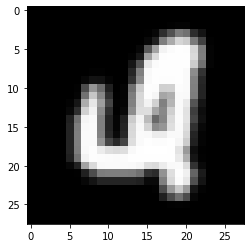

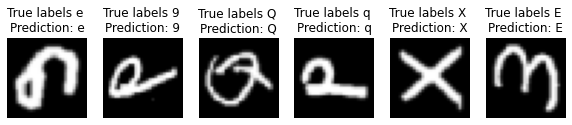

In [31]:
# Test the result on test data

# make a prediction for a sample randomly chose from the test dataset
# you can run this part repeatedly, see the classification result from the model
model_cnn = torch.load("/Users/karthiktalluri/Desktop/uk/Sem2/Applied_AI/Assg/assg2/cnn_best.pt")
import random
rand_no = random.randint(0,10000)
print(rand_no)

x_test,y_test = next(iter(test_loader))

y_pred = (model_cnn(x_test).argmax(dim=1))

plt.imshow(x_test[rand_no].reshape(28,28),cmap='gray')

pred = model_cnn(x_test[rand_no].reshape(-1,1,28,28)).argmax()

print("Prediction is {}".format(pred))

# compute the accuracy

# compute the accuracy of the model

print("Accuracy is : ",(y_pred.eq(y_test).sum()/test_size).item()*100,"%")

# Visulize some test figures
figure = plt.figure(figsize=(10, 10))
cols= 6
mapper = {}
path = 'emnist-balanced-mapping.txt'
with open(path) as f:
    for line in f:
       (key, val) = line.split()
       mapper[int(key)] = int(val)
for i in range(1, cols + 1):
    sample_idx = torch.randint(len(test_set), size=(1,)).item()
    print("Prediction: {}".format(sample_idx))
    img, label = test_set[i]
    # print(img.shape)
    pred = model_cnn(img.reshape(-1,1,28,28)).argmax()
    figure.add_subplot(rows, cols, i)
    # plt.title("Label "+ str(label))
    plt.title(f"True labels {chr(mapper[label])} \nPrediction: {chr(mapper[pred.item()])}")
    plt.axis("off")
    plt.imshow(img.squeeze(), cmap="gray")
plt.show()


### Plot confusion matrix

/var/folders/yr/yp7st9kx4kj5v2qcvbgv3f540000gn/T/ipykernel_42124/519184945.py:35: UserWarning: Implicit dimension choice for log_softmax has been deprecated. Change the call to include dim=X as an argument.
  return F.log_softmax(x)


- Test Loss:  0.39353516923620346 

- Accuracy:  87.00531914893617 

- Confusion Matrix: 
 
 Actual      0    1    2    3    4    5    6    7    8    9   ...   37   38  \
Predicted                                                    ...             
0          220    0    0    0    0    0    0    0    0    0  ...    2    0   
1            0  253    1    0    0    0    0    0    0    0  ...    0    0   
2            0    0  354    0    0    0    0    0    1    0  ...    0    3   
3            1    0    0  384    0    2    0    0    1    1  ...    0    0   
4            0    0    0    0  366    0    0    0    0    1  ...    0    1   
5            0    0    0    0    0  347    0    0    2    1  ...    0    0   
6            0    0    0    0    1    0  361    0    0    0  ...   24    0   
7            0    0    0    0    0    1    0  383    1    3  ...    0    0   
8            0    0    0    0    0    0    0    0  365    1  ...    1    1   
9            0    0    0    0    0    0    0    2

Text(0.5, 1.0, 'Confusion Matrix')

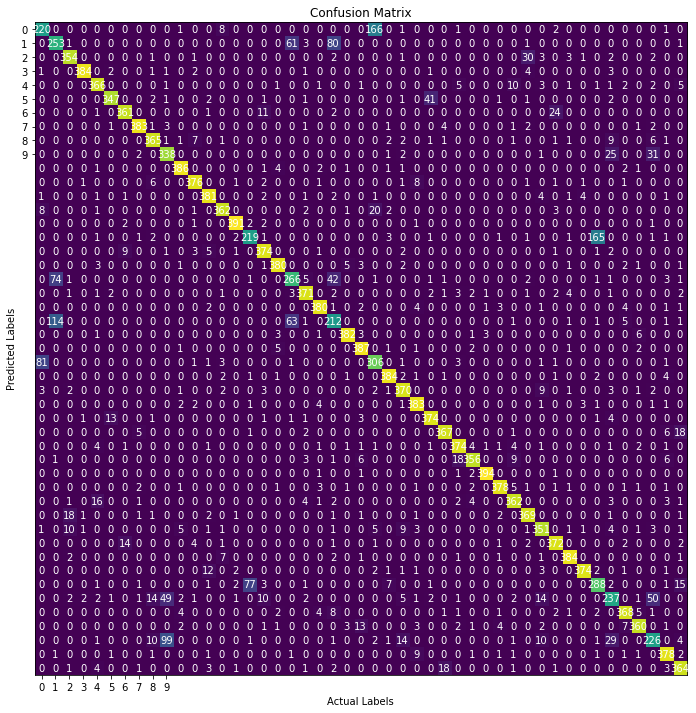

In [21]:
from sklearn.metrics import f1_score, precision_score, recall_score
# we also can plot the Confusion Matrix
import pandas as pd
import torch.nn.functional as F

# accuracy function 
def testing_accuracy(model, data_loader):
    model.eval()
    test_loss = 0
    device = 'cpu'

    y_pred = []
    y_actu = []
    with torch.no_grad():
        for data, target in data_loader:
            data, target = data.to(device), target.to(device)
            output = model(data)
            test_loss += F.nll_loss(output, target, reduction='sum').item()  # sum up batch loss
            # get the index of the max log-probability
            pred = output.argmax(dim=1, keepdim=True)
            y_pred.extend(torch.flatten(pred).tolist()) 
            y_actu.extend(target.tolist())
           
    y_pred = pd.Series(y_pred, name='Actual')
    y_actu = pd.Series(y_actu, name='Predicted')
    cm = pd.crosstab(y_actu, y_pred)
    correct = sum([cm.iloc[i,i] for i in range(len(cm))])
    
    test_loss /= len(data_loader.dataset)
    accuracy = 100*correct/len(test_loader.dataset)
    f1 = f1_score(y_actu, y_pred, average="weighted")
    precision = precision_score(y_actu, y_pred, average= "weighted")
    recall = recall_score(y_actu, y_pred, average= "weighted")

    return (test_loss, accuracy, cm, precision, recall, f1)

test_results = testing_accuracy(model_cnn, test_loader)

print("- Test Loss: ", test_results[0], "\n")
print("- Accuracy: ", test_results[1], "\n")
print("- Confusion Matrix: \n \n",  test_results[2] )
print(f"precision is {test_results[3]}")
print(f"recall is {test_results[4]}")
print(f"f1 score is {test_results[5]}")

import numpy as np
import matplotlib.pyplot as plt

conf_matrix = test_results[2].to_numpy()

fig, ax = plt.subplots(figsize=(20,12))
im = ax.imshow(conf_matrix)

ax.set_xticks(np.arange(10))
ax.set_yticks(np.arange(10))

for i in range(conf_matrix.shape[0]):
    for j in range(conf_matrix.shape[1]):
        text = ax.text(j, i, conf_matrix[i, j],
                       ha="center", va="center", color="w")
        
ax.set_xlabel('Actual Labels')
ax.set_ylabel('Predicted Labels')
ax.set_title('Confusion Matrix')